In [53]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import lime
from lime import lime_tabular, submodular_pick
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score 
from sklearn.ensemble import GradientBoostingClassifier

In [31]:
train_pca_dataset = pd.read_csv('Datasets/PCA_train_data.csv')
test_pca_dataset = pd.read_csv('Datasets/PCA_test_data.csv')

X_pca_train = train_pca_dataset.drop(['is_attack' , 'attack_category' , 'attack'], axis=1)
y_pca_train = train_pca_dataset['attack_category']

X_pca_test = test_pca_dataset.drop(['is_attack' , 'attack_category' , 'attack'], axis=1)
y_pca_test = test_pca_dataset['attack_category']

In [32]:
train_pca_dataset = train_pca_dataset.drop(['is_attack' , 'attack'], axis=1)

In [28]:
gbm_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
gbm_clf.fit(X_pca_train, y_pca_train)

GradientBoostingClassifier(random_state=42)

In [33]:
features = train_pca_dataset.drop(columns=['attack_category'])
labels = train_pca_dataset['attack_category']

In [61]:
predict_fn = lambda x: gbm_clf.predict_proba(x)
explainer = lime.lime_tabular.LimeTabularExplainer(
    train_pca_dataset[features.columns].astype(int).values, 
    mode='classification', 
    class_names=labels.value_counts().index.tolist(), 
    feature_names=features.columns)

In [63]:
i = 1500
exp=explainer.explain_instance(test_pca_dataset.loc[i,features.columns].astype(int).values, predict_fn, num_features=5)
exp.show_in_notebook(show_table=True)

In [69]:
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        test_pca_dataset[features.columns].values,
                                        predict_fn, 
                                        num_features=10)

In [71]:
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


SP-LIME Local Explanations


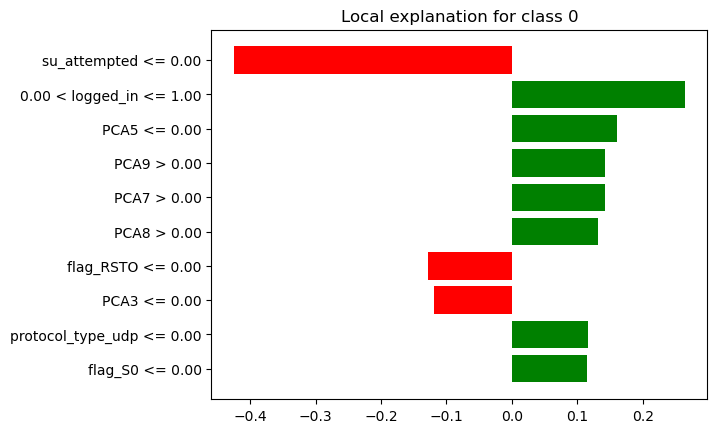

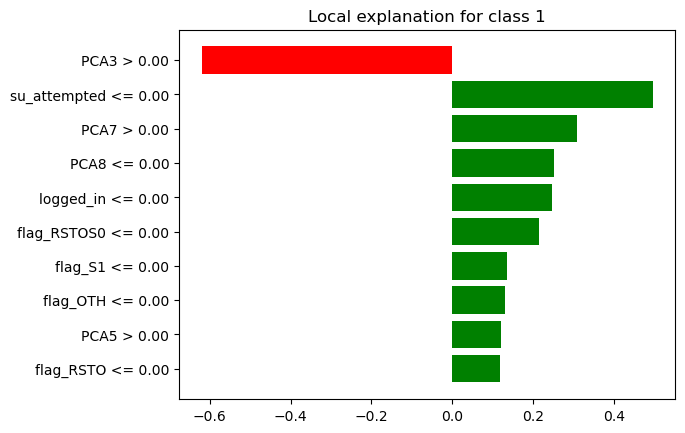

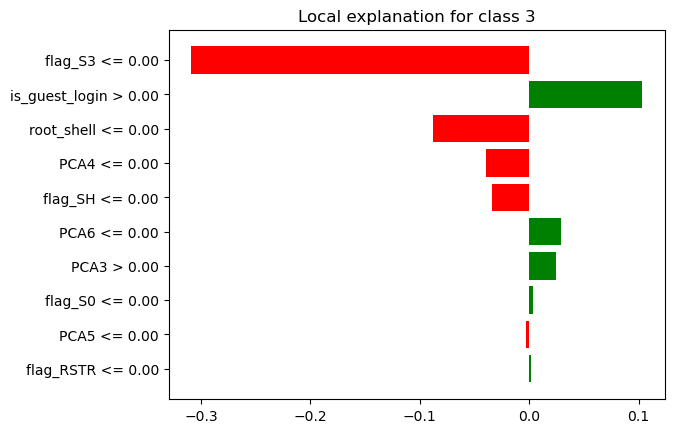

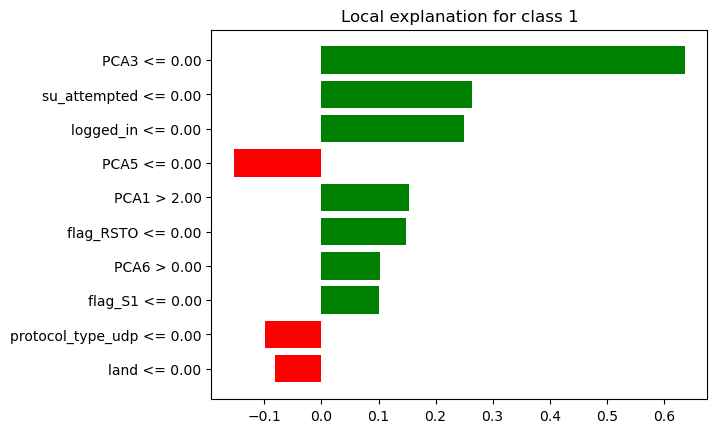

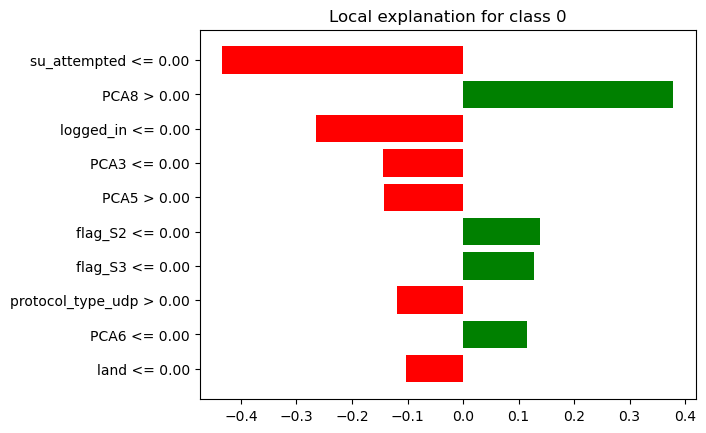

In [72]:
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp.sp_explanations]
print('SP-LIME Local Explanations')